In [1]:
#! pip install kaggle 

In [2]:
#! kaggle datasets download -d jpmiller/police-violence-racial-equity

In [3]:
import pyspark 
from pyspark.sql import SparkSession
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from zipfile import ZipFile 
from pyspark.sql.functions import substring


In [4]:
# filename = 'police-violence-racial-equity.zip'
# with ZipFile (filename,'r') as zip:
#     zip.printdir()
#     print("Extracting all files ...")
#     zip.extractall()
#     print("Done")


In [5]:
spark = SparkSession.builder.appName('crime_detection').config("spark.driver.memory", "4g").config("spark.executor.memory", "4g").config("spark.driver.memoryOverhead", "512m").config("spark.executor.memoryOverhead", "512m").config("spark.ui.port", "4041").config("spark.driver.port", "1041").config("spark.blockManager.port", "1042").getOrCreate() 
spark

# Data Cleaning

In [6]:
df = spark.read.csv('crime_data/LA Crime_Data_from_2010_to_2019.csv',inferSchema=True,header=True)
df = df.withColumnRenamed('AREA ', 'AREA') \
       .withColumnRenamed('Date Rptd', 'Date_Rptd') \
       .withColumnRenamed('DATE OCC', 'DATE_OCC') \
       .withColumnRenamed('TIME OCC', 'TIME_OCC') \
       .withColumnRenamed('Rpt Dist No', 'Rpt_Dist_No') \
       .withColumnRenamed('Part 1-2', 'Part_1-2') \
       .withColumnRenamed('Crm Cd', 'Crm_Cd') \
       .withColumnRenamed('Crm Cd Desc', 'Crm_Cd_Desc') \
       .withColumnRenamed('Vict Age', 'Vict_Age') \
       .withColumnRenamed('Vict Sex', 'Vict_Sex') \
       .withColumnRenamed('Vict Descent', 'Vict_Descent') \
       .withColumnRenamed('Premis Cd', 'Premis_Cd') \
       .withColumnRenamed('Premis Desc', 'Premis_Desc') \
       .withColumnRenamed('Weapon Used Cd', 'Weapon_Used_Cd') \
       .withColumnRenamed('Weapon Desc', 'Weapon_Desc') \
       .withColumnRenamed('Status Desc', 'Status_Desc') \
       .withColumnRenamed('Crm Cd 1', 'Crm_Cd_1') \
       .withColumnRenamed('Crm Cd 2', 'Crm_Cd_2') \
       .withColumnRenamed('Crm Cd 3', 'Crm_Cd_3') \
       .withColumnRenamed('Crm Cd 4', 'Crm_Cd_4') \
       .withColumnRenamed('Cross Street', 'Cross_Street')

df.show(5)
df.printSchema()

+---------+--------------------+--------------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO|           Date_Rptd|            DATE_OCC|TIME_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+--------------------+--------------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--

DR_NO is a unique code for each crime report

In [7]:
df.groupBy('DR_NO').count().orderBy('count').show()

+---------+-----+
|    DR_NO|count|
+---------+-----+
|100100868|    1|
|100100523|    1|
|100100985|    1|
|100100578|    1|
|100100764|    1|
|100100839|    1|
|100101203|    1|
|100100943|    1|
|100100642|    1|
|100101023|    1|
|100101610|    1|
|100105215|    1|
|100101228|    1|
|100106251|    1|
|100104326|    1|
|100106028|    1|
|100100570|    1|
|100106511|    1|
|100105475|    1|
|100107006|    1|
+---------+-----+
only showing top 20 rows



Selecting unique values of time

In [8]:
df.groupBy(substring("Date_Rptd", -8, 8).alias("Date_Rptd")).count().show()

+---------+-------+
|Date_Rptd|  count|
+---------+-------+
| 00:00 AM|2114699|
+---------+-------+



In [9]:
df.groupBy(substring("DATE_OCC",-8,8).alias("DATE_OCC")).count().show()

+--------+-------+
|DATE_OCC|  count|
+--------+-------+
|00:00 AM|2114699|
+--------+-------+



Removing timing from Date_Rptd 

In [10]:
df = df.withColumn('Date_Rptd',substring('Date_Rptd',1,10))
df.select('Date_Rptd').show(5)

+----------+
| Date_Rptd|
+----------+
|02/20/2010|
|09/13/2010|
|08/09/2010|
|01/05/2010|
|01/03/2010|
+----------+
only showing top 5 rows



In [11]:
df = df.withColumn('DATE_OCC',substring('DATE_OCC',1,10))
df.select('DATE_OCC').show(5)

+----------+
|  DATE_OCC|
+----------+
|02/20/2010|
|09/12/2010|
|08/09/2010|
|01/05/2010|
|01/02/2010|
+----------+
only showing top 5 rows



Formatting the dates for DATE_OCC,Date_Rptd

In [12]:
from pyspark.sql.functions import to_date
df = df.withColumn('Date_Rptd',to_date('Date_Rptd',"MM/dd/yyyy"))
df = df.withColumn('DATE_OCC',to_date('DATE_OCC',"MM/dd/yyyy"))
df.select('Date_Rptd').show(4)
df.select('DATE_OCC').show(4)


+----------+
| Date_Rptd|
+----------+
|2010-02-20|
|2010-09-13|
|2010-08-09|
|2010-01-05|
+----------+
only showing top 4 rows

+----------+
|  DATE_OCC|
+----------+
|2010-02-20|
|2010-09-12|
|2010-08-09|
|2010-01-05|
+----------+
only showing top 4 rows



Formatting the TIME_OCC column

In [13]:
from pyspark.sql.functions import col,concat,lit,to_timestamp
df = df.withColumn('TIME_OCC',col('TIME_OCC').cast('string'))
df.select('TIME_OCC').show(5)

+--------+
|TIME_OCC|
+--------+
|    1350|
|      45|
|    1515|
|     150|
|    2100|
+--------+
only showing top 5 rows



In [14]:
df = df.withColumn("TIME_OCC", concat(lit("00"), col("TIME_OCC")))
df.select('TIME_OCC').show(5)

+--------+
|TIME_OCC|
+--------+
|  001350|
|    0045|
|  001515|
|   00150|
|  002100|
+--------+
only showing top 5 rows



In [15]:
df = df.withColumn("TIME_OCC", concat(substring("TIME_OCC", -4, 2), lit(":"), substring("TIME_OCC", -2, 2)))
df.select('TIME_OCC').show()


+--------+
|TIME_OCC|
+--------+
|   13:50|
|   00:45|
|   15:15|
|   01:50|
|   21:00|
|   16:50|
|   20:05|
|   21:00|
|   02:30|
|   21:00|
|   14:45|
|   20:00|
|   02:45|
|   17:45|
|   20:30|
|   17:35|
|   12:25|
|   11:00|
|   20:00|
|   18:20|
+--------+
only showing top 20 rows



In [16]:
from pyspark.sql.functions import concat_ws
#concat both cols DATE_OCC,TIME_OCC with seperator " "
df = df.withColumn("DATE_OCC", concat_ws(" ", df["DATE_OCC"], df["TIME_OCC"]))
df.show()

+---------+----------+----------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|        DATE_OCC|TIME_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+----------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------

In [17]:
df = df.withColumn("DATE_OCC", to_timestamp(df["DATE_OCC"]))
df.show()


+---------+----------+-------------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|TIME_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+--------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+-----

In [18]:
df.select('DATE_OCC').show()

+-------------------+
|           DATE_OCC|
+-------------------+
|2010-02-20 13:50:00|
|2010-09-12 00:45:00|
|2010-08-09 15:15:00|
|2010-01-05 01:50:00|
|2010-01-02 21:00:00|
|2010-01-04 16:50:00|
|2010-01-07 20:05:00|
|2010-01-08 21:00:00|
|2010-01-09 02:30:00|
|2010-01-06 21:00:00|
|2010-01-14 14:45:00|
|2010-01-14 20:00:00|
|2010-01-15 02:45:00|
|2010-01-15 17:45:00|
|2010-01-15 20:30:00|
|2010-01-16 17:35:00|
|2010-01-23 12:25:00|
|2010-01-23 11:00:00|
|2010-01-23 20:00:00|
|2010-01-26 18:20:00|
+-------------------+
only showing top 20 rows



In [19]:
df = df.drop('TIME_OCC')
df.show(3)

+--------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|   DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+--------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
| 1307355|2010-02-20|2

Mocodes Column

Replacing null values with unknown

In [20]:
df.filter(col('Mocodes').isNull()).show(5)

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|100100535|2010-01-17|2010-01-16 17:35:0

In [21]:
from pyspark.sql.functions import when 
df = df.withColumn("Mocodes", when(df["Mocodes"].isNull(), "unknown").otherwise(df["Mocodes"]))
df.show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---

Vict Age

setting negative values to 0

In [22]:
df.groupBy('Vict_Age').count().show()

+--------+-----+
|Vict_Age|count|
+--------+-----+
|      31|43056|
|      85| 1539|
|      65|11573|
|      53|26056|
|      78| 3236|
|      34|40276|
|      81| 2407|
|      28|46445|
|      76| 3845|
|      27|47011|
|      26|47469|
|      44|31466|
|      12| 7175|
|      91|  647|
|      22|41818|
|      93|  448|
|      47|30779|
|      52|27089|
|      13| 9649|
|      16|15187|
+--------+-----+
only showing top 20 rows



In [23]:
df = df.withColumn("Vict_Age", when(df["Vict_Age"] < 0, 0).otherwise(df["Vict_Age"]))
df.show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---

Vict Sex 

In [24]:
df.groupBy('Vict_Sex').count().show()

+--------+------+
|Vict_Sex| count|
+--------+------+
|       F|888499|
|    NULL|196671|
|       M|974309|
|       X| 55129|
|       H|    73|
|       -|     1|
|       N|    17|
+--------+------+



In [25]:
df = df.withColumn('Vict_Sex', when(((df['Vict_Sex'] != 'M') & (df['Vict_Sex'] != 'F')), 'X').otherwise(df['Vict_Sex']))
df.filter(col('Vict_Sex').contains('X')).show()

+---------+----------+-------------------+----+----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA| AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|             Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+-----------

Vict Descent

In [26]:
na_vals = df.filter(col('Vict_Descent').isNull()).count()
print(f"The reported crimes with null values for Vict_Descent col is: {na_vals}")

The reported crimes with null values for Vict_Descent col is: 196718


In [27]:
df.groupBy('Vict_Descent').count().show()

+------------+------+
|Vict_Descent| count|
+------------+------+
|           K|  9141|
|           F|  2553|
|        NULL|196718|
|           B|335102|
|           V|   201|
|           U|   190|
|           O|202969|
|           D|    23|
|           C|  1061|
|           J|   418|
|           Z|   136|
|           A| 51109|
|           X| 78147|
|           W|510158|
|           S|    31|
|           G|    85|
|           I|   945|
|           P|   343|
|           H|725348|
|           L|    18|
+------------+------+
only showing top 20 rows



In [28]:
df = df.withColumn('Vict_Descent', when(((df['Vict_Descent'] == '-') | (df['Vict_Descent'].isNull())), 'X').otherwise(df['Vict_Descent']))
df.show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---

Premis Cd and Premis Desc

In [29]:
df.filter(col('Premis_Cd').isNull()).show()

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|100121447|2010-12-12|2010-12-12 11:50:00|   1|    Central|  

In [30]:
df.filter(df['Premis_Desc'] == 'unknown').select('Premis_Desc','Premis_Cd').show()

+-----------+---------+
|Premis_Desc|Premis_Cd|
+-----------+---------+
+-----------+---------+



In [31]:
from pyspark.sql.functions import isnan
df = df.withColumn('Premis_Cd', when(isnan(df['Premis_Cd']) | df['Premis_Cd'].isNull(), 0).otherwise(df['Premis_Cd']))
df.show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---

In [32]:
df.filter(col('Premis_Cd') == 0).show()

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|100121447|2010-12-12|2010-12-12 11:50:00|   1|    Central|  

In [33]:
df = df.withColumn('Premis_Desc',when(isnan(df['Premis_Desc']) | df['Premis_Desc'].isNull(),'unknown').otherwise(df['Premis_Desc']))
df.filter(col('Premis_Desc') == 'unknown').show()

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|100121447|2010-12-12|2010-12-12 11:50:00|   1|    Central|  

In [34]:
df.filter(col('Premis_Desc') == 'unknown').select('Premis_Desc','Premis_Cd').show()

+-----------+---------+
|Premis_Desc|Premis_Cd|
+-----------+---------+
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
|    unknown|        0|
+-----------+---------+
only showing top 20 rows



In [35]:
cd_unique = df.filter(col('Premis_Desc') == 'unknown').select('Premis_Cd').distinct()
cd_unique_list = [row['Premis_Cd'] for row in cd_unique.collect()]
print(cd_unique_list)

[0, 838, 418, 256]


- Premis_Cd values: 0,838,418,256 have Premis_Desc: unknown

In [36]:
df.filter(col('Premis_Cd') == 418).select('Premis_Desc','Premis_Cd').distinct().show()
df.filter(col('Premis_Cd') == 256).select('Premis_Desc','Premis_Cd').distinct().show()
df.filter(col('Premis_Cd') == 838).select('Premis_Desc','Premis_Cd').distinct().show()

+-----------+---------+
|Premis_Desc|Premis_Cd|
+-----------+---------+
|    unknown|      418|
+-----------+---------+

+-----------+---------+
|Premis_Desc|Premis_Cd|
+-----------+---------+
|    unknown|      256|
+-----------+---------+

+-----------+---------+
|Premis_Desc|Premis_Cd|
+-----------+---------+
|    unknown|      838|
+-----------+---------+



In [37]:
df = df.withColumn('Premis_Cd',
                   when(
                       (col('Premis_Cd') == 256) | 
                       (col('Premis_Cd') == 418) | 
                       (col('Premis_Cd') == 838), 
                       0
                   ).otherwise(df['Premis_Cd']))

Weapon Used Cd and Weapon Desc

Replacing the null values with 0's

In [38]:
df.filter(col('Weapon_Used_Cd').isNull()).show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|  1307355|2010-02-

In [39]:
df = df.withColumn('Weapon_Used_Cd',
                   when(
                       (col('Weapon_Used_Cd').isNull()) | (isnan(col('Weapon_Used_Cd'))),
                       0
                   ).otherwise(col('Weapon_Used_Cd')))

df.filter(col('Weapon_Used_Cd') == 0).select('Weapon_Used_Cd').show(5)


+--------------+
|Weapon_Used_Cd|
+--------------+
|             0|
|             0|
|             0|
|             0|
|             0|
+--------------+
only showing top 5 rows



In [40]:
df.filter(col('Weapon_Desc').isNull()).show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|  1307355|2010-02-

In [41]:
df = df.withColumn('Weapon_Desc',when(df['Weapon_Desc'].isNull() | isnan(col('Weapon_Desc')),'unknown').otherwise(df['Weapon_Desc']))
df.filter(col('Weapon_Desc') == 'unknown').show(5)

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+-----------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|  1307355|2010-02-

Status and Status Desc 

In [42]:
df.groupBy('Status').count().show()
df.groupBy('Status_Desc').count().show()

+------+-------+
|Status|  count|
+------+-------+
|    IC|1623829|
|    AA| 219081|
|  NULL|      3|
|    JO|   5301|
|    JA|  15864|
|    AO| 250589|
|    CC|     29|
|    TH|      1|
|    13|      1|
|    19|      1|
+------+-------+

+------------+-------+
| Status_Desc|  count|
+------------+-------+
|  Juv Arrest|  15864|
|         UNK|     35|
|   Juv Other|   5301|
| Invest Cont|1623829|
| Adult Other| 250589|
|Adult Arrest| 219081|
+------------+-------+



Status: CC,TH,13,19 have status_desc: UNK

In [43]:
df.filter(col('Status_Desc') == 'UNK').show()

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|             Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status|Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+-----------

In [44]:
df = df.withColumn('Status',when(
    (df['Status'] == '19') | 
    (df['Status'] == '13') |
    (df['Status'] == 'TH') | 
    (df['Status'].isNull()),'CC'
).otherwise(df['Status']))
df.filter(col('Status') == 'CC').show(5)

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|             Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status|Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+-----------

In [45]:
df = df.withColumn('Status_Desc',when(col('Status_Desc').isNull(),'UNK').otherwise(df['Status_Desc']))
df.filter(col('Status_Desc') == 'UNK').show(5)

+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|  AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|             Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status|Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+-----------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+-----------+--------+--------+--------+--------+--------------------+-----------

Crm Cd (Crime Code)

- Crm Cd 1: primary and serious
- Crm Cd 2, 3, and 4 are less serious offenses
- Crm Cd 2 can't be there without Crm Cd 1  

In [46]:
df.filter(col('Crm_Cd_1').isNull()).show()

+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------------+-------+---------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|             Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_1|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|            LOCATION|        Cross_Street|    LAT|      LON|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------+--------+--------+--------------------+--------------

In [47]:
df = df.withColumn("Crm_Cd_1", when(col("Crm_Cd_1").isNull(), col("Crm_Cd_2")).otherwise(col("Crm_Cd_1")))
df = df.withColumn("Crm_Cd_2", when(col("Crm_Cd_1").isNull(), col("Crm_Cd_3")).otherwise(col("Crm_Cd_2")))
df = df.withColumn("Crm_Cd_3", when(col("Crm_Cd_1").isNull(), col("Crm_Cd_4")).otherwise(col("Crm_Cd_3")))

#df = df.withColumn("Crm Cd 4", when(col("Crm_Cd_1").isNull(), None).otherwise(col("Crm_Cd_4")))

Filling null values with -1 

In [48]:
df = df.fillna({'Crm_Cd_2': -1, 'Crm_Cd_3': -1, 'Crm_Cd_4': -1})
df.select('Crm_Cd_2','Crm_Cd_3','Crm_Cd_4').show()

+--------+--------+--------+
|Crm_Cd_2|Crm_Cd_3|Crm_Cd_4|
+--------+--------+--------+
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|     998|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|     998|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|     999|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
|      -1|      -1|      -1|
+--------+--------+--------+
only showing top 20 rows



In [49]:
from pyspark.sql.functions import when, col

# Swap 'Crm Cd 2' with 'Crm Cd 1' where 'Crm Cd' equals 'Crm Cd 2', and 'Crm Cd 1' with 'Crm Cd'
df = df.withColumn('Crm_Cd_2_New', when(col('Crm_Cd') == col('Crm_Cd_2'), col('Crm_Cd_1')).otherwise(col('Crm_Cd_2')))
df = df.withColumn('Crm_Cd_1_New', when(col('Crm_Cd') == col('Crm_Cd_2'), col('Crm_Cd')).otherwise(col('Crm_Cd_1')))

# Swap 'Crm Cd 3' with 'Crm Cd 1' where 'Crm Cd' equals 'Crm Cd 3', and 'Crm Cd 1' with 'Crm Cd'
df = df.withColumn('Crm_Cd_3_New', when(col('Crm_Cd') == col('Crm_Cd_3'), col('Crm_Cd_1')).otherwise(col('Crm_Cd_3')))
df = df.withColumn('Crm_Cd_1_Newer', when(col('Crm_Cd') == col('Crm_Cd_3'), col('Crm_Cd')).otherwise(col('Crm_Cd_1_New')))

# Drop the old 'Crm Cd 1' and intermediate 'Crm Cd 1 New' column, and rename the 'Newer' columns back
df = df.drop('Crm_Cd_1', 'Crm_Cd_2', 'Crm_Cd_3', 'Crm_Cd_1_New') \
                     .withColumnRenamed('Crm_Cd_1_Newer', 'Crm_Cd_1') \
                     .withColumnRenamed('Crm_Cd_2_New', 'Crm_Cd_2') \
                     .withColumnRenamed('Crm_Cd_3_New', 'Crm_Cd_3')

# Since 'Crm Cd' and 'Crm Cd 1' are now the same, drop 'Crm Cd 1'
#df = df.drop('Crm_Cd_1')

# Display the DataFrame schema to verify the column has been dropped
df.printSchema()


root
 |-- DR_NO: integer (nullable = true)
 |-- Date_Rptd: date (nullable = true)
 |-- DATE_OCC: timestamp (nullable = true)
 |-- AREA: integer (nullable = true)
 |-- AREA NAME: string (nullable = true)
 |-- Rpt_Dist_No: integer (nullable = true)
 |-- Part_1-2: integer (nullable = true)
 |-- Crm_Cd: integer (nullable = true)
 |-- Crm_Cd_Desc: string (nullable = true)
 |-- Mocodes: string (nullable = true)
 |-- Vict_Age: integer (nullable = true)
 |-- Vict_Sex: string (nullable = true)
 |-- Vict_Descent: string (nullable = true)
 |-- Premis_Cd: integer (nullable = true)
 |-- Premis_Desc: string (nullable = true)
 |-- Weapon_Used_Cd: integer (nullable = true)
 |-- Weapon_Desc: string (nullable = true)
 |-- Status: string (nullable = true)
 |-- Status_Desc: string (nullable = true)
 |-- Crm_Cd_4: integer (nullable = false)
 |-- LOCATION: string (nullable = true)
 |-- Cross_Street: string (nullable = true)
 |-- LAT: double (nullable = true)
 |-- LON: double (nullable = true)
 |-- Crm_Cd_2:

In [50]:
df.filter(col('Crm_Cd') == col('Crm_Cd_4')).show()


+-----+---------+--------+----+---------+-----------+--------+------+-----------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+-----------+--------+--------+------------+---+---+--------+--------+--------+
|DR_NO|Date_Rptd|DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|Crm_Cd_Desc|Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|Premis_Desc|Weapon_Used_Cd|Weapon_Desc|Status|Status_Desc|Crm_Cd_4|LOCATION|Cross_Street|LAT|LON|Crm_Cd_2|Crm_Cd_3|Crm_Cd_1|
+-----+---------+--------+----+---------+-----------+--------+------+-----------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+-----------+--------+--------+------------+---+---+--------+--------+--------+
+-----+---------+--------+----+---------+-----------+--------+------+-----------+-------+--------+--------+------------+---------+-----------+--------------+-----------+------+-----------+--------+--------+------------+---+---+--------

In [51]:
df = df.drop('Crm_Cd_1')

Location 

In [52]:
df.groupBy('LOCATION').count().show()

+--------------------+-----+
|            LOCATION|count|
+--------------------+-----+
|900 W  OLYMPIC   ...|  461|
|STADIUM          ...|   58|
|1500 W  2ND      ...|  331|
|900 S  CARONDELET...|   99|
|4000    MARATHON ...|  132|
|1300 W  5TH      ...|  146|
|1200    BOSTON   ...|   43|
|2700    HYANS    ...|   14|
|300 S  UNION     ...|   26|
|CRANDALL         ...|    1|
|              LITTLE|    8|
|1900    EXPOSITIO...|   12|
|4700    10TH     ...|   32|
|1800 W  41ST     ...|   53|
|1300 W  ADAMS    ...|   61|
|4900    3RD      ...|   24|
|3900 S  VERMONT  ...|   69|
|600 W  27TH      ...|   33|
|2200 W  30TH     ...|   56|
|10TH             ...|  128|
+--------------------+-----+
only showing top 20 rows



In [53]:
from pyspark.sql.functions import regexp_replace, trim

# Replace multiple spaces with a single space and trim leading/trailing spaces in 'LOCATION'
df = df.withColumn('LOCATION', trim(regexp_replace('LOCATION', ' +', ' ')))

# Show the result to verify the transformation
df.select('LOCATION').show()


+-----------------+
|         LOCATION|
+-----------------+
|    300 E GAGE AV|
|     SEPULVEDA BL|
|   1300 E 21ST ST|
|      CAHUENGA BL|
|           8TH ST|
|     700 W 7TH ST|
|          PICO BL|
|   500 CROCKER ST|
| 800 W OLYMPIC BL|
|   200 S OLIVE ST|
|   900 N BROADWAY|
|       ALAMEDA ST|
|  1100 S OLIVE ST|
|     600 W 5TH ST|
|              1ST|
| 300 E OLYMPIC BL|
| 1300 S FLOWER ST|
|600 SAN JULIAN ST|
|   200 S GRAND AV|
| 800 N ALAMEDA ST|
+-----------------+
only showing top 20 rows



Cross Street  

In [54]:
from pyspark.sql.functions import when, col, regexp_replace, trim

df = df.withColumn('Cross_Street', when(col('Cross_Street').isNull(), 'unknown').otherwise(col('Cross_Street')))


In [55]:
df = df.withColumn('Cross_Street', trim(regexp_replace('Cross_Street', ' +', ' ')))


In [56]:
filtered_la_crimes = df.filter(col('Cross_Street') == 'unknown')
filtered_la_crimes.show()


+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+------------------+------------+-------+---------+--------+--------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_4|          LOCATION|Cross_Street|    LAT|      LON|Crm_Cd_2|Crm_Cd_3|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+------------------+------------+-------+---------+--------+--------+
|  1307355|2010-02-20|2010-02-20 13:50:00|  13|  

In [57]:
df.groupBy('Cross_Street').count().show()


+--------------+-----+
|  Cross_Street|count|
+--------------+-----+
|S HOLLYWOOD FY|    1|
|         SAVOY|    5|
|        LITTLE|   10|
|     SAN PABLO|   30|
|   RIDGELEY AV|    2|
|       MARLTON|   61|
|       41ST DR|   23|
|    MEDFORD ST|    8|
|    MILFORD ST|    1|
| UNION PACIFIC|   33|
|       HANCOCK|   14|
|        HUNTER|   22|
|       JOHNSON|    6|
|     GAFFEY ST|  278|
|      240TH ST|    6|
|         182ND|   14|
|     ARGYLE RD|    1|
|        HUSTON|   44|
|     AVENUE 45|   52|
|     NEW DEPOT|   18|
+--------------+-----+
only showing top 20 rows



In [58]:
df = df.drop('Cross_Street')

# Feature Engineering 

Droping unnecessary columns 

In [59]:
col_ = ['AREA','Date_Rptd','Weapon_Used_Cd','Status']
df_cpy = df 
df = df.drop(*col_)
df.show(5)

+---------+-------------------+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------------+------------+--------+--------------+-------+---------+--------+--------+
|    DR_NO|           DATE_OCC|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|         Weapon_Desc| Status_Desc|Crm_Cd_4|      LOCATION|    LAT|      LON|Crm_Cd_2|Crm_Cd_3|
+---------+-------------------+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------------+------------+--------+--------------+-------+---------+--------+--------+
|  1307355|2010-02-20 13:50:00|   Newton|       1385|       2|   900|VIOLATION OF COUR...|0913 1814 2000|      48|       M|           H|      501|SINGLE FAMILY DWE...|             unknown|Adult Arrest|      -1| 300

In [60]:
#! pip install seaborn
# ! pip install folium
# ! pip install kmodes
# ! pip install plotly

In [61]:
import seaborn as sns
import folium
import json
from matplotlib import colors
import plotly.express as px

In [62]:
df = df \
    .withColumnRenamed('Status_Desc', 'STATUS') \
    .withColumnRenamed('AREA NAME', 'AREA_NAME') \
    .withColumnRenamed('Weapon_Desc', 'WEAPON_DESC') \
    .withColumnRenamed('Crm_Cd_Desc', 'CRM_DESC') \
    .withColumnRenamed('Vict_Age', 'VICT_AGE') \
    .withColumnRenamed('Vict_Sex', 'VICT_SEX') \
    .withColumnRenamed('Vict_Descent', 'VICT_DESC') \
    .withColumnRenamed('Crm_Cd_2', 'CRM_CD2') \
    .withColumnRenamed('Premis_Desc', 'PREMIS_DESC') \
    .withColumnRenamed('Crm_Cd_3', 'CRM_CD3') \
    .withColumnRenamed('Crm_Cd_4', 'CRM_CD4') \
    .withColumnRenamed('Rpt_Dist_No', 'DISTR_NO') \
    .withColumnRenamed('Part_1-2', 'PART1_2')
df.show(3)

+--------+-------------------+---------+--------+-------+------+--------------------+--------------+--------+--------+---------+---------+--------------------+-----------+------------+-------+--------------+-------+---------+-------+-------+
|   DR_NO|           DATE_OCC|AREA_NAME|DISTR_NO|PART1_2|Crm_Cd|            CRM_DESC|       Mocodes|VICT_AGE|VICT_SEX|VICT_DESC|Premis_Cd|         PREMIS_DESC|WEAPON_DESC|      STATUS|CRM_CD4|      LOCATION|    LAT|      LON|CRM_CD2|CRM_CD3|
+--------+-------------------+---------+--------+-------+------+--------------------+--------------+--------+--------+---------+---------+--------------------+-----------+------------+-------+--------------+-------+---------+-------+-------+
| 1307355|2010-02-20 13:50:00|   Newton|    1385|      2|   900|VIOLATION OF COUR...|0913 1814 2000|      48|       M|        H|      501|SINGLE FAMILY DWE...|    unknown|Adult Arrest|     -1| 300 E GAGE AV|33.9825|-118.2695|     -1|     -1|
|11401303|2010-09-12 00:45:00|  

# Data Visualization 

Finding all incidents where suspects use force code 0400 defines the suspect using force

In [63]:
from pyspark.sql.functions import col 
crimes_force = df.filter(col('Mocodes').contains('0400'))
crimes_force.show(5)

+---------+-------------------+---------+--------+-------+------+--------------------+--------------+--------+--------+---------+---------+-----------+--------------------+------------+-------+----------------+-------+---------+-------+-------+
|    DR_NO|           DATE_OCC|AREA_NAME|DISTR_NO|PART1_2|Crm_Cd|            CRM_DESC|       Mocodes|VICT_AGE|VICT_SEX|VICT_DESC|Premis_Cd|PREMIS_DESC|         WEAPON_DESC|      STATUS|CRM_CD4|        LOCATION|    LAT|      LON|CRM_CD2|CRM_CD3|
+---------+-------------------+---------+--------+-------+------+--------------------+--------------+--------+--------+---------+---------+-----------+--------------------+------------+-------+----------------+-------+---------+-------+-------+
| 90631215|2010-01-05 01:50:00|Hollywood|     646|      2|   900|VIOLATION OF COUR...|1100 0400 1402|      47|       F|        W|      101|     STREET|            HAND GUN| Invest Cont|     -1|     CAHUENGA BL|34.1016|-118.3295|    998|     -1|
|100100501|2010-01-0

In [64]:
counts = crimes_force.groupBy('CRM_DESC').count().orderBy(col('count').desc())
counts.show()

+--------------------+-----+
|            CRM_DESC|count|
+--------------------+-----+
|BATTERY - SIMPLE ...|48773|
|INTIMATE PARTNER ...|28953|
|             ROBBERY|15385|
|ASSAULT WITH DEAD...|13777|
|INTIMATE PARTNER ...| 2938|
|   ATTEMPTED ROBBERY| 2601|
|       THEFT, PERSON| 2211|
|      RAPE, FORCIBLE| 2210|
|BATTERY WITH SEXU...| 2148|
|CHILD ABUSE (PHYS...| 1848|
|CRIMINAL THREATS ...| 1847|
|BATTERY POLICE (S...| 1476|
|    RESISTING ARREST| 1152|
|CRM AGNST CHLD (1...|  950|
|            BURGLARY|  924|
|       OTHER ASSAULT|  915|
|VANDALISM - FELON...|  792|
|VANDALISM - MISDE...|  758|
|     BRANDISH WEAPON|  750|
|THEFT PLAIN - PET...|  737|
+--------------------+-----+
only showing top 20 rows



Percentage for each crime type where the suspect uses force

In [65]:
from pyspark.sql.functions import sum as _sum, col

# Assuming 'counts' is the DataFrame you got from the previous step
# Add a new column with the total sum of the 'count' column for all rows
total_count = counts.agg(_sum("count").alias("total_count")).collect()[0]["total_count"]

# Calculate the percentage of each 'count' relative to the total
# and add it as a new column 'percentage'
counts = counts.withColumn("percentage", (col("count") / total_count) * 100)

# Show the result
counts.show()


+--------------------+-----+------------------+
|            CRM_DESC|count|        percentage|
+--------------------+-----+------------------+
|BATTERY - SIMPLE ...|48773| 35.38249483115093|
|INTIMATE PARTNER ...|28953|21.004026261380538|
|             ROBBERY|15385|11.161086727846495|
|ASSAULT WITH DEAD...|13777|  9.99455910624252|
|INTIMATE PARTNER ...| 2938|2.1313794479306467|
|   ATTEMPTED ROBBERY| 2601|  1.88690195509449|
|       THEFT, PERSON| 2211|1.6039754797054662|
|      RAPE, FORCIBLE| 2210|1.6032500272044687|
|BATTERY WITH SEXU...| 2148| 1.558271972142624|
|CHILD ABUSE (PHYS...| 1848|1.3406362218433747|
|CRIMINAL THREATS ...| 1847|1.3399107693423773|
|BATTERY POLICE (S...| 1476|1.0707678914723058|
|    RESISTING ARREST| 1152|0.8357212811491167|
|CRM AGNST CHLD (1...|  950|0.6891798759476223|
|            BURGLARY|  924|0.6703181109216874|
|       OTHER ASSAULT|  915|  0.66378903841271|
|VANDALISM - FELON...|  792|0.5745583807900178|
|VANDALISM - MISDE...|  758|0.5498929957

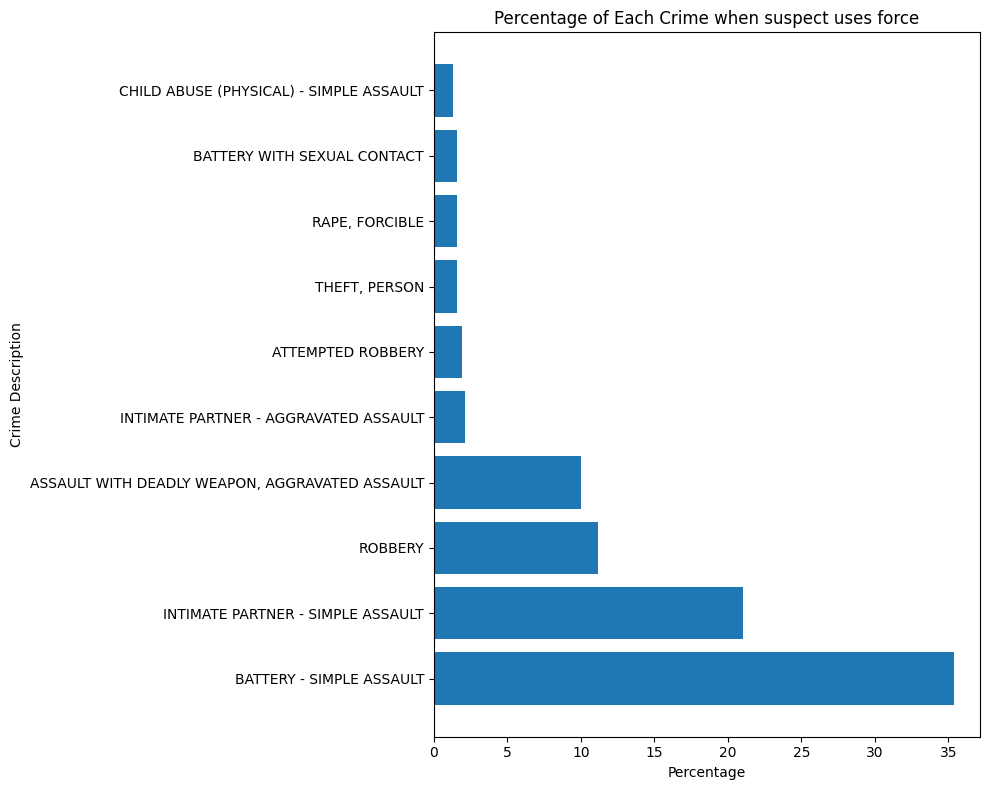

In [66]:
counts_pd = counts.toPandas()
counts_pd
plt.figure(figsize=(10, 8))
plt.barh(counts_pd['CRM_DESC'][:10], counts_pd['percentage'][:10])  # Ensuring both slices [:10]

plt.xlabel('Percentage')
plt.ylabel('Crime Description')
plt.title('Percentage of Each Crime when suspect uses force')

plt.tight_layout()
plt.show()


The suspect was a stranger. The mocode 1822 describes incidents that the suspect is a stranger

In [67]:
crimes_stranger = df.filter(col('Mocodes').contains('1822'))
crimes_stranger.show(5)

+---------+-------------------+---------+--------+-------+------+--------------------+-------------------+--------+--------+---------+---------+--------------------+-----------+-----------+-------+---------------+-------+---------+-------+-------+
|    DR_NO|           DATE_OCC|AREA_NAME|DISTR_NO|PART1_2|Crm_Cd|            CRM_DESC|            Mocodes|VICT_AGE|VICT_SEX|VICT_DESC|Premis_Cd|         PREMIS_DESC|WEAPON_DESC|     STATUS|CRM_CD4|       LOCATION|    LAT|      LON|CRM_CD2|CRM_CD3|
+---------+-------------------+---------+--------+-------+------+--------------------+-------------------+--------+--------+---------+---------+--------------------+-----------+-----------+-------+---------------+-------+---------+-------+-------+
|100106822|2010-02-24 07:00:00|  Central|     166|      1|   230|ASSAULT WITH DEAD...|0334 0411 1251 1822|      21|       M|        B|      101|              STREET|OTHER KNIFE|Invest Cont|     -1|   400 E 7TH ST|34.0419|-118.2485|     -1|     -1|
|1001075

In [68]:
counts_stranger = crimes_stranger.groupBy('CRM_DESC').count().orderBy(col('count').desc())
counts_stranger.show(5)

+--------------------+-----+
|            CRM_DESC|count|
+--------------------+-----+
|   THEFT OF IDENTITY|85881|
|             ROBBERY|13467|
|ASSAULT WITH DEAD...|12912|
|DOCUMENT FORGERY ...|12457|
|BATTERY - SIMPLE ...| 9519|
+--------------------+-----+
only showing top 5 rows



In [69]:
total_count = counts_stranger.agg(_sum("count").alias("total_count")).collect()[0]["total_count"]
counts_stranger = counts_stranger.withColumn("percentage", (col("count") / total_count) * 100)
counts_stranger.show()


+--------------------+-----+------------------+
|            CRM_DESC|count|        percentage|
+--------------------+-----+------------------+
|   THEFT OF IDENTITY|85881| 42.27633871872877|
|             ROBBERY|13467| 6.629352866467792|
|ASSAULT WITH DEAD...|12912| 6.356144962636972|
|DOCUMENT FORGERY ...|12457|6.1321637081450415|
|BATTERY - SIMPLE ...| 9519| 4.685884750568568|
|            BURGLARY| 8960| 4.410707780764195|
|THEFT PLAIN - PET...| 8370| 4.120270549664767|
|BURGLARY FROM VEH...| 7006|  3.44881905268236|
|VANDALISM - FELON...| 4499|2.2147069537564854|
|THEFT-GRAND ($950...| 4120|2.0281379527621075|
|VANDALISM - MISDE...| 3968|1.9533134457670003|
|THEFT FROM MOTOR ...| 2498|1.2296817004853748|
|       THEFT, PERSON| 2448|1.2050683758159317|
|   ATTEMPTED ROBBERY| 2139|1.0529580293587737|
|CRIMINAL THREATS ...| 2039|1.0037313800198875|
|     BRANDISH WEAPON| 1953|0.9613964615884455|
|SHOPLIFTING - PET...| 1522|0.7492296029378464|
|BATTERY WITH SEXU...| 1509|0.7428301385

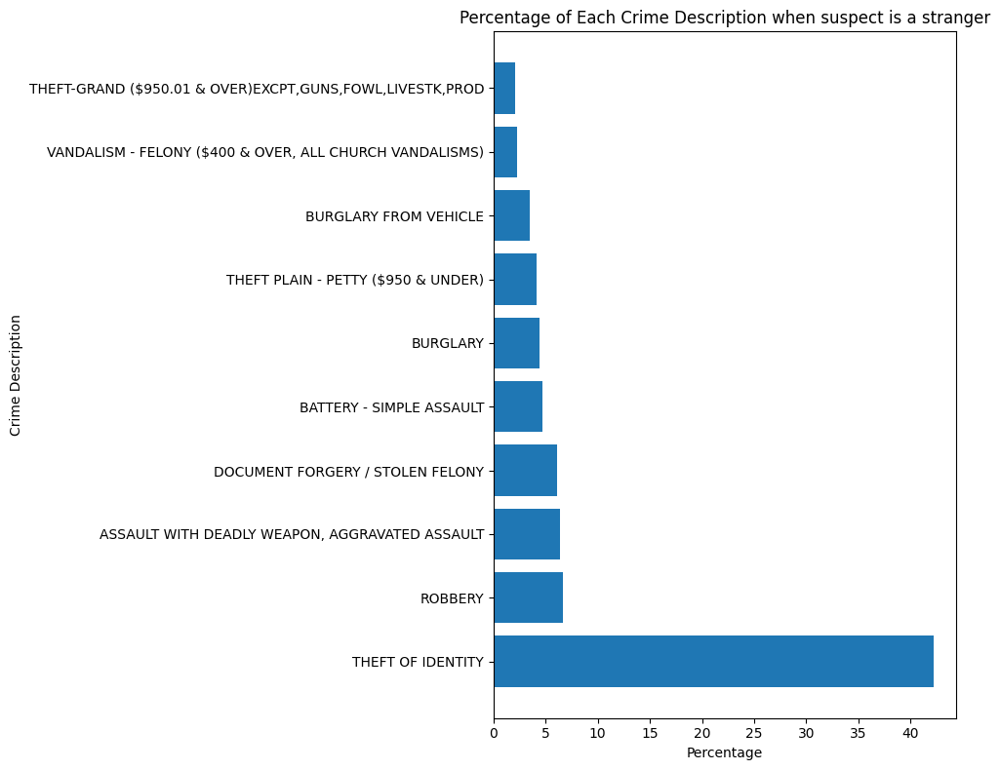

In [70]:
counts_stranger_pd = counts_stranger.toPandas()
counts_stranger_pd
plt.figure(figsize=(10, 8))
plt.barh(counts_stranger_pd['CRM_DESC'][:10], counts_stranger_pd['percentage'][:10])  # Ensuring both slices [:10]

plt.xlabel('Percentage')
plt.ylabel('Crime Description')
plt.title('Percentage of Each Crime Description when suspect is a stranger')
plt.tight_layout()
plt.show()


Visualizing the delay between occurence and reporting the crime 
-   Calculate the time delay between the actual date it happened and the date it was reported to the LAPD


In [71]:
from pyspark.sql.functions import to_date, datediff, col

df_cpy.show(5)

# Convert 'DATE_RPTD' and 'DATE_OCC' from string to date
df_cpy = df_cpy.withColumn("DATE_RPTD", to_date(col("DATE_RPTD"), "MM/dd/yyyy"))
df_cpy = df_cpy.withColumn("DATE_OCC", to_date(col("DATE_OCC"), "MM/dd/yyyy"))

# Calculate the difference in days between 'DATE_RPTD' and 'DATE_OCC'
df_cpy = df_cpy.withColumn("TIME_DIFF", datediff(col("DATE_RPTD"), col("DATE_OCC")))

# Display the result
df_cpy.select("DATE_RPTD", "DATE_OCC", "TIME_DIFF").show()


+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------------+-------+---------+--------+--------+
|    DR_NO| Date_Rptd|           DATE_OCC|AREA|AREA NAME|Rpt_Dist_No|Part_1-2|Crm_Cd|         Crm_Cd_Desc|       Mocodes|Vict_Age|Vict_Sex|Vict_Descent|Premis_Cd|         Premis_Desc|Weapon_Used_Cd|         Weapon_Desc|Status| Status_Desc|Crm_Cd_4|      LOCATION|    LAT|      LON|Crm_Cd_2|Crm_Cd_3|
+---------+----------+-------------------+----+---------+-----------+--------+------+--------------------+--------------+--------+--------+------------+---------+--------------------+--------------+--------------------+------+------------+--------+--------------+-------+---------+--------+--------+
|  1307355|2010-02-20|2010-02-20 13:50:00|  13|   Newton|       1385|       2|   900|VIOLATION OF CO

In [72]:
df_cpy_pd = df_cpy.toPandas()

In [73]:
from pyspark.sql.functions import col, avg

# Adjusting the code to use the correct column name 'Crm_Cd_Desc' for 'CRM_DESC'
crimes_delay = df_cpy.groupBy("Crm_Cd_Desc") \
                     .agg(avg("TIME_DIFF").alias("avg_TIME_DIFF")) \
                     .orderBy(col("avg_TIME_DIFF").desc())

# Attempt to show the result again
crimes_delay.show()
crimes_delay_pd = crimes_delay.toPandas()

+--------------------+------------------+
|         Crm_Cd_Desc|     avg_TIME_DIFF|
+--------------------+------------------+
|LEWD/LASCIVIOUS A...| 434.1856540084388|
|CRM AGNST CHLD (1...|329.81155629532753|
|SEXUAL PENETRATIO...| 260.7019940915805|
|     ORAL COPULATION|250.43872017353578|
|      TRAIN WRECKING|             235.5|
|SODOMY/SEXUAL CON...|230.20254862508384|
|HUMAN TRAFFICKING...| 185.1734693877551|
|SEX,UNLAWFUL(INC ...| 182.4196736382441|
|SEX OFFENDER REGI...|151.37123947051745|
|      RAPE, FORCIBLE| 144.6667963809709|
|GRAND THEFT / INS...| 136.7887323943662|
|              BIGAMY|134.76923076923077|
|   THEFT OF IDENTITY|120.33161939558103|
|EMBEZZLEMENT, GRA...|103.41896444167186|
|HUMAN TRAFFICKING...|102.18879668049793|
|             PIMPING| 91.24261603375527|
|DOCUMENT WORTHLES...| 84.33783783783784|
|CHILD ANNOYING (1...| 80.95111976630965|
|   CHILD PORNOGRAPHY| 79.63677130044843|
|INCEST (SEXUAL AC...|  76.9090909090909|
+--------------------+------------

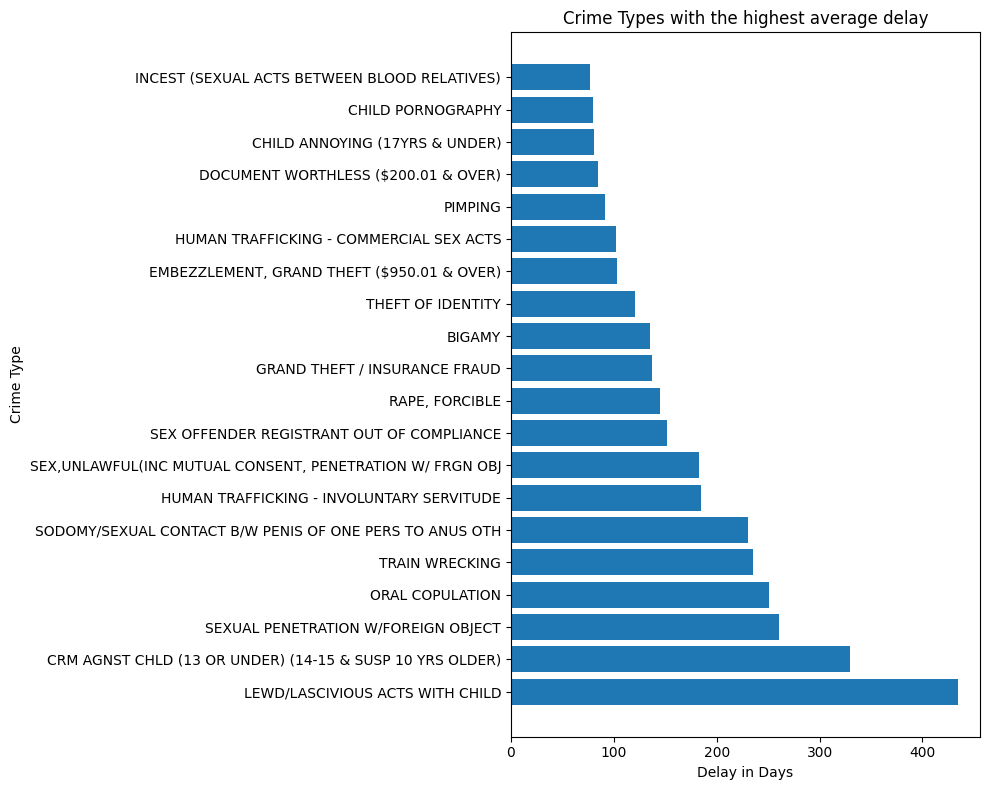

In [74]:
crimes_delay_pd
plt.figure(figsize=(10, 8))
plt.barh(crimes_delay_pd['Crm_Cd_Desc'][:20],crimes_delay_pd['avg_TIME_DIFF'][:20])  # Ensuring both slices [:10]

plt.ylabel('Crime Type')
plt.xlabel('Delay in Days')
plt.title('Crime Types with the highest average delay')
plt.tight_layout()
plt.show()

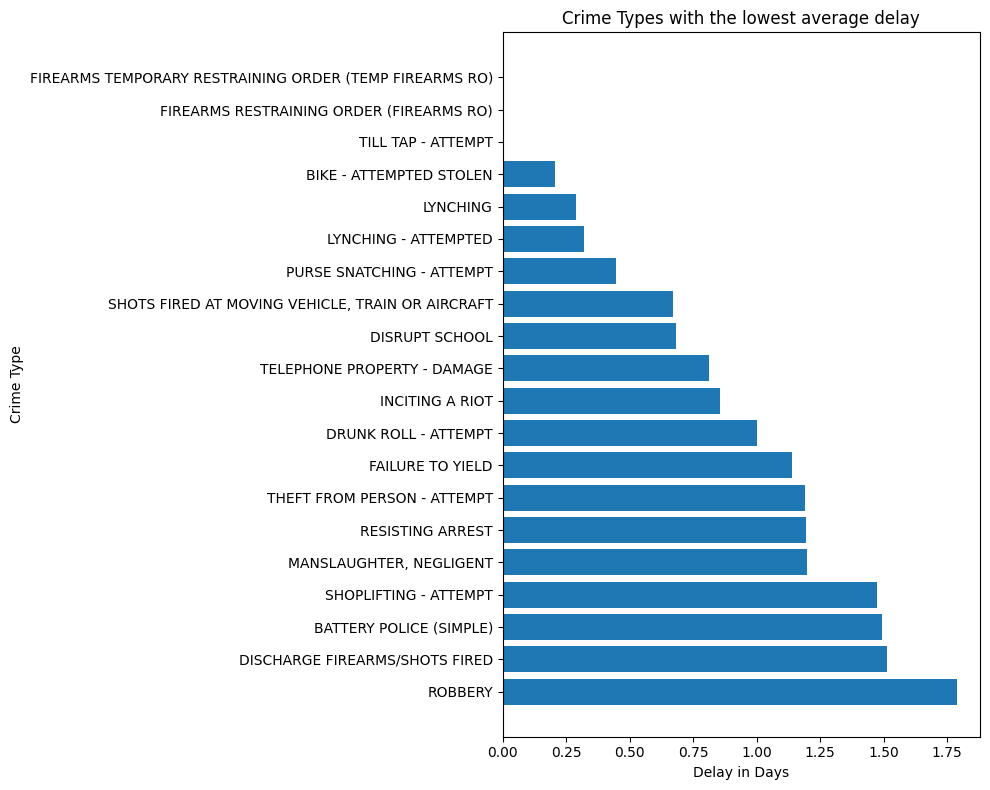

In [75]:
plt.figure(figsize=(10, 8))
plt.barh(crimes_delay_pd['Crm_Cd_Desc'][-20:],crimes_delay_pd['avg_TIME_DIFF'][-20:])  # Ensuring both slices [:10]

plt.ylabel('Crime Type')
plt.xlabel('Delay in Days')
plt.title('Crime Types with the lowest average delay')
plt.tight_layout()
plt.show()

Visualizing all crimes on the LA Map 

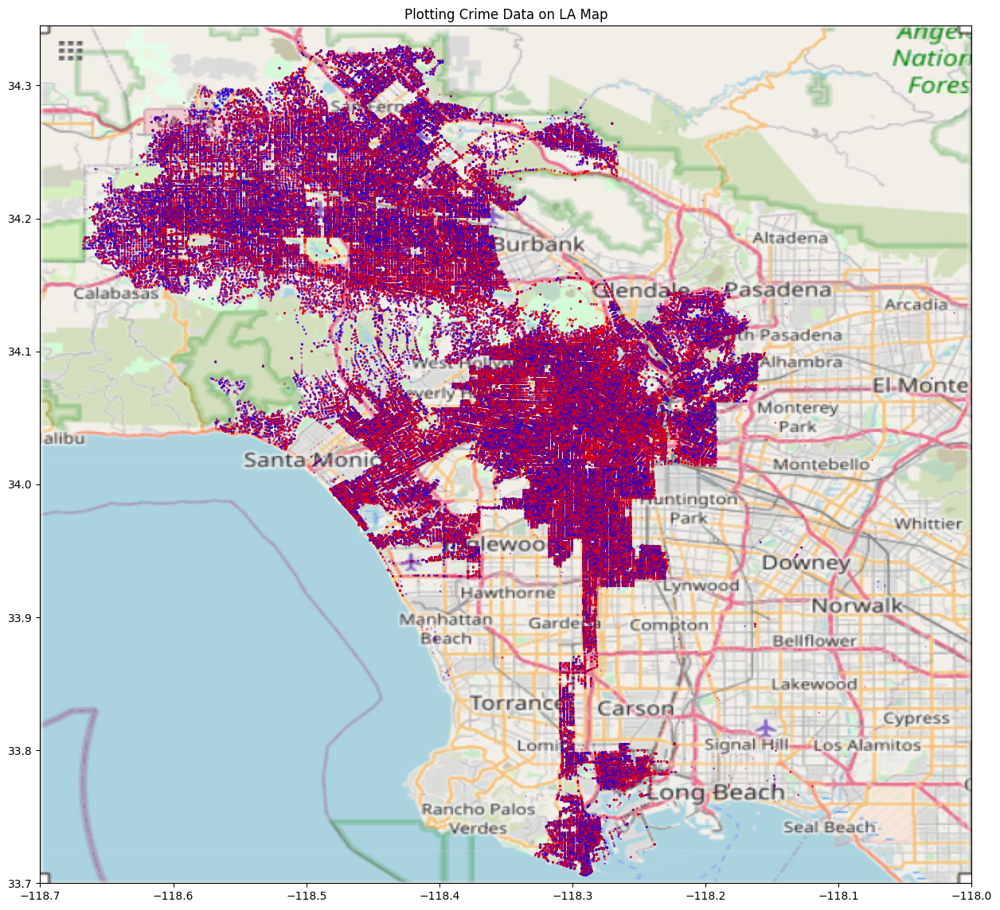

In [76]:
BBox = ((-118.7000, -118, 33.7000, 34.3450)) 
ruh_m = plt.imread('lamap.png') 
fig,ax1 = plt.subplots(figsize = (16,14))
colormap = colors.ListedColormap(['red','blue'])
ax1.scatter(df_cpy_pd.LON, df_cpy_pd.LAT, zorder=1, alpha= 0.2, cmap=colormap,
           c=df_cpy_pd['Part_1-2'], s=1,)
ax1.set_title('Plotting Crime Data on LA Map')
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])
ax1.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')


Geographical Clustering

In [77]:
location = df.select('LAT','LON')
location = location.filter((col('LAT') != 0) & (col('LON') != 0))
location.show(5)
location_pd = location.toPandas()

+-------+---------+
|    LAT|      LON|
+-------+---------+
|33.9825|-118.2695|
|33.9599|-118.3962|
|34.0224|-118.2524|
|34.1016|-118.3295|
|34.0387|-118.2488|
+-------+---------+
only showing top 5 rows



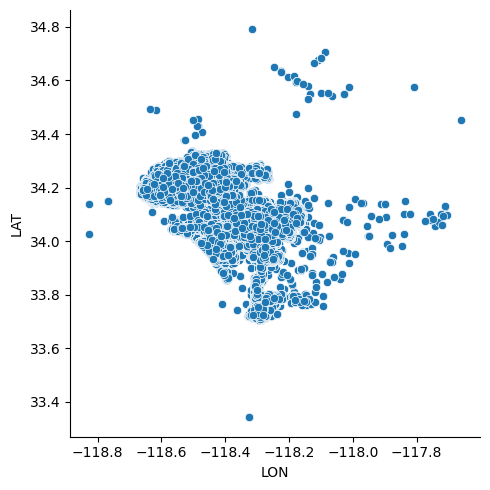

In [78]:
sns.relplot(y='LAT',x='LON',data=location_pd)

Plotting random samples of data on to LA map 

In [79]:
fig = px.scatter_mapbox(location_pd.sample(100000), lat="LAT", lon="LON",
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


# Kmeans Clustering 

In [80]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler,StandardScaler
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import mean, stddev, col

train_data,test_data = location.randomSplit([0.7,0.3],seed=0)
assembler = VectorAssembler(inputCols=['LAT', 'LON'], outputCol='features')
train_df = assembler.transform(train_data)
test_df = assembler.transform(test_data)
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)
scaler_model = scaler.fit(train_df)
train_df = scaler_model.transform(train_df)
test_df = scaler_model.transform(test_df)
train_df.show(5)
test_df.show(5)



+-------+---------+-------------------+--------------------+
|    LAT|      LON|           features|     scaled_features|
+-------+---------+-------------------+--------------------+
|33.7062|-118.2917|[33.7062,-118.2917]|[-3.2078297330454...|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|
|33.7068|-118.2879|[33.7068,-118.2879]|[-3.2026566069202...|
| 33.707|-118.2916| [33.707,-118.2916]|[-3.2009322315451...|
+-------+---------+-------------------+--------------------+
only showing top 5 rows

+-------+---------+-------------------+--------------------+
|    LAT|      LON|           features|     scaled_features|
+-------+---------+-------------------+--------------------+
|33.7062|-118.2917|[33.7062,-118.2917]|[-3.2078297330454...|
|33.7065|-118.2879|[33.7065,-118.2879]|[-3.2052431699828...|
| 33.707|-118.2916| [33.707,-118.2916]|[-3.2009322315451...|
|33.7079|-118.2879|[33.7079,-118.2879]|[-3.1931725423572...|

In [81]:
wssse_train_scores,wssse_test_scores = [],[]
evaluator = ClusteringEvaluator(predictionCol='prediction', featuresCol='scaled_features', \
                                metricName='silhouette', distanceMeasure='squaredEuclidean')

for i in range(2,8):    
    KMeans_model = KMeans(featuresCol='scaled_features', k=i,seed=0)  
    model = KMeans_model.fit(train_df)  
    train_predictions = model.transform(train_df)
    test_predictions = model.transform(test_df)   
    train_score = evaluator.evaluate(train_predictions)
    test_score = evaluator.evaluate(test_predictions)   
    wssse_train_scores.append(train_score)
    wssse_test_scores.append(test_score)  
    print(f"Silhouette Score for k={i} | Train score: {train_score} Test score: {test_score}")


Silhouette Score for k=2 | Train score: 0.7322942428377445 Test score: 0.7321367584818453
Silhouette Score for k=3 | Train score: 0.49225226047092585 Test score: 0.4907743987839934
Silhouette Score for k=4 | Train score: 0.4949913578659054 Test score: 0.4932126213544947
Silhouette Score for k=5 | Train score: 0.451123712957093 Test score: 0.4492901444280098
Silhouette Score for k=6 | Train score: 0.6003993627878642 Test score: 0.6008392474224924
Silhouette Score for k=7 | Train score: 0.6279229300047391 Test score: 0.6281913898139837


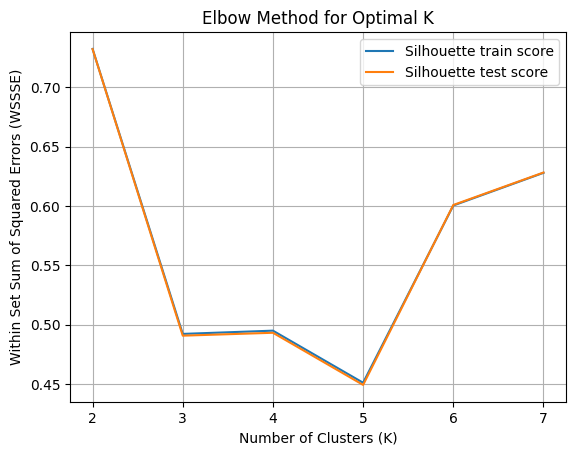

In [82]:
k_values = range(2,8)
plt.plot(k_values, wssse_train_scores,label='Silhouette train score')
plt.plot(k_values,wssse_test_scores,label='Silhouette test score')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within Set Sum of Squared Errors (WSSSE)')
plt.title('Elbow Method for Optimal K')
plt.legend()
plt.grid(True)
plt.show()


In [83]:
optimal_k = 5 
kmeans = KMeans(k=optimal_k, featuresCol="scaled_features", predictionCol="cluster",seed=0)
kmeans_model = kmeans.fit(train_df)
clustered_train_predictions = kmeans_model.transform(train_df)
clustered_test_predictions = kmeans_model.transform(test_df)
clustered_train_predictions.show(5)
clustered_test_predictions.show(5)

+-------+---------+-------------------+--------------------+-------+
|    LAT|      LON|           features|     scaled_features|cluster|
+-------+---------+-------------------+--------------------+-------+
|33.7062|-118.2917|[33.7062,-118.2917]|[-3.2078297330454...|      2|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|      2|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|      2|
|33.7068|-118.2879|[33.7068,-118.2879]|[-3.2026566069202...|      2|
| 33.707|-118.2916| [33.707,-118.2916]|[-3.2009322315451...|      2|
+-------+---------+-------------------+--------------------+-------+
only showing top 5 rows

+-------+---------+-------------------+--------------------+-------+
|    LAT|      LON|           features|     scaled_features|cluster|
+-------+---------+-------------------+--------------------+-------+
|33.7062|-118.2917|[33.7062,-118.2917]|[-3.2078297330454...|      2|
|33.7065|-118.2879|[33.7065,-118.2879]|[-3.2052431699828...|      2|
| 33.707|

In [84]:
evaluator = ClusteringEvaluator(predictionCol='cluster', featuresCol='scaled_features', \
                                metricName='silhouette', distanceMeasure='squaredEuclidean')
test_score = evaluator.evaluate(clustered_test_predictions)
print(f"Silhouette Score on Test Data: {test_score}")


Silhouette Score on Test Data: 0.4492901444280098


In [85]:
cluster_centers = kmeans_model.clusterCenters()
print("Cluster centers: ")
for center in cluster_centers:
    print(center)
centers_x = [center[0] for center in cluster_centers]
centers_y = [center[1] for center in cluster_centers]


Cluster centers: 
[-0.30471484 -0.17392846]
[ 0.90854549 -0.21835282]
[-0.66890721  0.8524205 ]
[ 1.32906898 -0.91513196]
[ 1.07642373 -1.99420626]


In [86]:
clustered_data_pd = clustered_train_predictions.toPandas()

In [87]:
clustered_data_pd

,LAT,LON,features,scaled_features,cluster
0,33.7062,-118.2917,"[33.7062, -118.2917]","[-3.207829733045467, 0.6350163481346475]",2
1,33.7065,-118.2928,"[33.7065, -118.2928]","[-3.2052431699828836, 0.6246550622813724]",2
2,33.7065,-118.2928,"[33.7065, -118.2928]","[-3.2052431699828836, 0.6246550622813724]",2
3,33.7068,-118.2879,"[33.7068, -118.2879]","[-3.202656606920239, 0.6708098810826417]",2
4,33.7070,-118.2916,"[33.707, -118.2916]","[-3.200932231545163, 0.6359582832122544]",2
...,...,...,...,...,...
1479606,34.3275,-118.4247,"[34.3275, -118.4247]","[2.1489423696405487, -0.6177573050410009]",3
1479607,34.3277,-118.4071,"[34.3277, -118.4071]","[2.1506667450156245, -0.4519767313876613]",3
1479608,34.3277,-118.4071,"[34.3277, -118.4071]","[2.1506667450156245, -0.4519767313876613]",3
1479609,34.3286,-118.4314,"[34.3286, -118.4314]","[2.158426434203497, -0.6808669552385266]",3


In [88]:
clustered_data_pd['scaled_features']

0           [-3.207829733045467, 0.6350163481346475]
1          [-3.2052431699828836, 0.6246550622813724]
2          [-3.2052431699828836, 0.6246550622813724]
3           [-3.202656606920239, 0.6708098810826417]
4           [-3.200932231545163, 0.6359582832122544]
                             ...                    
1479606    [2.1489423696405487, -0.6177573050410009]
1479607    [2.1506667450156245, -0.4519767313876613]
1479608    [2.1506667450156245, -0.4519767313876613]
1479609     [2.158426434203497, -0.6808669552385266]
1479610     [2.168772686453953, -0.6676798641525643]
Name: scaled_features, Length: 1479611, dtype: object

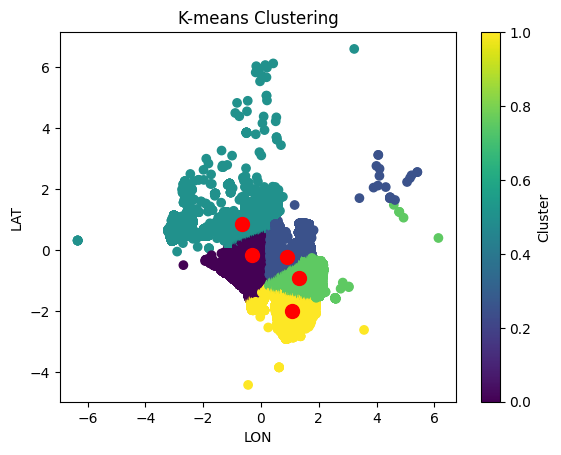

In [89]:
lon_vals = clustered_data_pd['scaled_features'].apply(lambda x: x[0])
lat_vals = clustered_data_pd['scaled_features'].apply(lambda x: x[1])

plt.scatter(lon_vals,lat_vals,c=clustered_data_pd['cluster'],cmap='viridis')
plt.scatter(centers_x, centers_y, color='red', marker='o', s=100, label='Cluster Centers')

plt.xlabel("LON")
plt.ylabel("LAT")
plt.title("K-means Clustering")
plt.colorbar().set_label("Cluster")
plt.show()

In [90]:
clustered_train_predictions.show()

+-------+---------+-------------------+--------------------+-------+
|    LAT|      LON|           features|     scaled_features|cluster|
+-------+---------+-------------------+--------------------+-------+
|33.7062|-118.2917|[33.7062,-118.2917]|[-3.2078297330454...|      2|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|      2|
|33.7065|-118.2928|[33.7065,-118.2928]|[-3.2052431699828...|      2|
|33.7068|-118.2879|[33.7068,-118.2879]|[-3.2026566069202...|      2|
| 33.707|-118.2916| [33.707,-118.2916]|[-3.2009322315451...|      2|
| 33.707|-118.2916| [33.707,-118.2916]|[-3.2009322315451...|      2|
| 33.707|-118.2912| [33.707,-118.2912]|[-3.2009322315451...|      2|
| 33.707|-118.2901| [33.707,-118.2901]|[-3.2009322315451...|      2|
|33.7071| -118.288| [33.7071,-118.288]|[-3.2000700438576...|      2|
|33.7079|-118.2929|[33.7079,-118.2929]|[-3.1931725423572...|      2|
|33.7079|-118.2916|[33.7079,-118.2916]|[-3.1931725423572...|      2|
|33.7079|-118.2907|[33.7079,-118.2

In [91]:
means = scaler_model.mean
stds = scaler_model.std

# Manually calculating the inverse transformation
original_cluster_centers = []
for center in cluster_centers:
    original_center = [(center[i] * stds[i]) + means[i] for i in range(len(center))]
    original_cluster_centers.append(original_center)

# Printing the inversely transformed cluster centers
print("Original cluster centers: ")
for center in original_cluster_centers:
    print(center)


Original cluster centers: 
[34.04291495657175, -118.37758116442103]
[34.183633774591456, -118.3822974507804]
[34.00067445840114, -118.26861941255272]
[34.2324077829109, -118.45627061066716]
[34.20310496957274, -118.57082991737536]


In [92]:
cluster_data_pd = clustered_train_predictions.select('LAT','LON','cluster').toPandas()

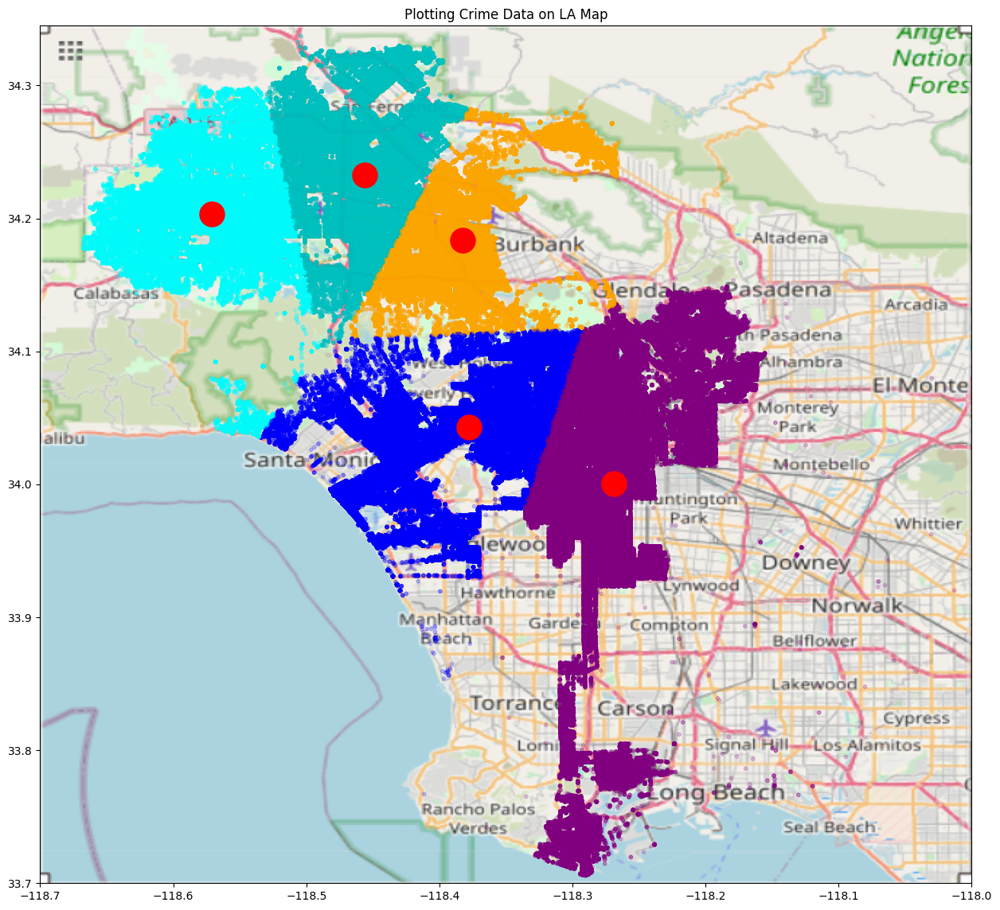

In [93]:
fig, ax = plt.subplots(figsize=(16, 14))
colormap = colors.ListedColormap(['blue', 'orange', 'purple', 'c','cyan'])

scatter = ax.scatter(clustered_data_pd['LON'], clustered_data_pd['LAT'], zorder=1, alpha=0.2, 
                     c=clustered_data_pd['cluster'], cmap=colormap, s=10)
for center in original_cluster_centers:
    ax.scatter(center[1], center[0], zorder=2, alpha=1, color='red', s=500)

# 'BBox' defines the bounding box for the LA map area using geographical coordinates.
#longitude and latitude bounds: (min longitude, max longitude, min latitude, max latitude).
BBox = ((-118.7000, -118.0000, 33.7000, 34.3450))
ax.set_title('Plotting Crime Data on LA Map')
ax.set_xlim(BBox[0], BBox[1])
ax.set_ylim(BBox[2], BBox[3])
ruh_m = plt.imread('lamap.png')
ax.imshow(ruh_m, zorder=0, extent=BBox, aspect='equal')

plt.show()

We can say the centeroids are the locations of the police stations in LA

# Clustering on categorical variables 

We will be using kmodes clustering for this part 

Crime description

In [94]:
from pyspark.sql.functions import desc 

crime_types = df.groupBy("CRM_DESC").count().orderBy(desc("count"))
crime_types = crime_types.limit(35)
crime_types.show()
crime_types_pd = crime_types.toPandas()

+--------------------+------+
|            CRM_DESC| count|
+--------------------+------+
|BATTERY - SIMPLE ...|190543|
|BURGLARY FROM VEH...|162160|
|    VEHICLE - STOLEN|159857|
|THEFT PLAIN - PET...|149820|
|            BURGLARY|147641|
|   THEFT OF IDENTITY|126998|
|INTIMATE PARTNER ...|114540|
|VANDALISM - FELON...|109440|
|ASSAULT WITH DEAD...| 92704|
|VANDALISM - MISDE...| 90426|
|THEFT FROM MOTOR ...| 88478|
|             ROBBERY| 83856|
|THEFT-GRAND ($950...| 74530|
|CRIMINAL THREATS ...| 56639|
|SHOPLIFTING - PET...| 48396|
|THEFT FROM MOTOR ...| 31638|
|DOCUMENT FORGERY ...| 22801|
|         TRESPASSING| 21588|
|LETTERS, LEWD  - ...| 21180|
|OTHER MISCELLANEO...| 20692|
+--------------------+------+
only showing top 20 rows



Weapon types 

In [95]:
weapon_types = df.groupBy("WEAPON_DESC").count().orderBy(desc("count"))
weapon_types = weapon_types.limit(23)
weapon_types.show()
weapon_types_pd = weapon_types.toPandas()


+--------------------+-------+
|         WEAPON_DESC|  count|
+--------------------+-------+
|             unknown|1404461|
|STRONG-ARM (HANDS...| 430506|
|       VERBAL THREAT|  58644|
|UNKNOWN WEAPON/OT...|  57423|
|            HAND GUN|  34112|
|SEMI-AUTOMATIC PI...|  12904|
|KNIFE WITH BLADE ...|  12844|
|         OTHER KNIFE|   9785|
|     UNKNOWN FIREARM|   7902|
|             VEHICLE|   7237|
|            REVOLVER|   5565|
|              BOTTLE|   5050|
|  ROCK/THROWN OBJECT|   4582|
|               STICK|   4568|
|            CLUB/BAT|   4364|
|       FOLDING KNIFE|   4270|
|    BLUNT INSTRUMENT|   4259|
|   MACE/PEPPER SPRAY|   4033|
|       KITCHEN KNIFE|   3792|
|       SIMULATED GUN|   3556|
+--------------------+-------+
only showing top 20 rows



In [96]:
premises_types = df.groupBy('PREMIS_DESC').count().orderBy(desc('count'))
premises_types = premises_types.limit(22)
premises_types.show()
premises_types_pd = premises_types.toPandas()

+--------------------+------+
|         PREMIS_DESC| count|
+--------------------+------+
|              STREET|472827|
|SINGLE FAMILY DWE...|428513|
|MULTI-UNIT DWELLI...|265481|
|         PARKING LOT|149916|
|            SIDEWALK|105816|
|      OTHER BUSINESS| 96622|
|VEHICLE, PASSENGE...| 79676|
|            DRIVEWAY| 42545|
|      GARAGE/CARPORT| 37574|
|RESTAURANT/FAST FOOD| 29079|
|    DEPARTMENT STORE| 28594|
|              MARKET| 21836|
|         OTHER STORE| 16451|
|PARKING UNDERGROU...| 15808|
|     PARK/PLAYGROUND| 14716|
|YARD (RESIDENTIAL...| 14426|
|               ALLEY| 13762|
|       OTHER PREMISE| 13139|
|         HIGH SCHOOL| 12910|
|          DRUG STORE| 10586|
+--------------------+------+
only showing top 20 rows



Merging the data into a new df 

In [97]:
df_pd = df.toPandas()

In [98]:
crimes_kmode = pd.merge (df_pd, crime_types_pd, on='CRM_DESC' )
crimes_kmode = pd.merge (crimes_kmode, weapon_types_pd, on='WEAPON_DESC' )
crimes_kmode = pd.merge (crimes_kmode, premises_types_pd, on='PREMIS_DESC' )
crimes_kmode

,DR_NO,DATE_OCC,AREA_NAME,DISTR_NO,PART1_2,Crm_Cd,CRM_DESC,Mocodes,VICT_AGE,VICT_SEX,...,STATUS,CRM_CD4,LOCATION,LAT,LON,CRM_CD2,CRM_CD3,count_x,count_y,count
0,1307355,2010-02-20 13:50:00,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,...,Adult Arrest,-1,300 E GAGE AV,33.9825,-118.2695,-1,-1,20038,1404461,428513
1,11401303,2010-09-12 00:45:00,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,0,M,...,Invest Cont,-1,SEPULVEDA BL,33.9599,-118.3962,-1,-1,109440,1404461,472827
2,70309629,2010-08-09 15:15:00,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,...,Invest Cont,-1,1300 E 21ST ST,34.0224,-118.2524,-1,-1,20692,1404461,13762
3,90631215,2010-01-05 01:50:00,Hollywood,646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,...,Invest Cont,-1,CAHUENGA BL,34.1016,-118.3295,998,-1,20038,34112,472827
4,100100506,2010-01-04 16:50:00,Central,162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,23,M,...,Adult Arrest,-1,700 W 7TH ST,34.0480,-118.2577,-1,-1,48396,1404461,28594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1769019,190506304,2019-02-22 08:40:00,Harbor,569,2,627,CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT,0443 0419 0416 1259,14,F,...,Adult Other,-1,100 W 22ND ST,33.7257,-118.2801,-1,-1,9287,430506,14716
1769020,190715222,2019-08-14 18:10:00,Wilshire,701,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER),1300 0344,40,M,...,Invest Cont,-1,WILLOUGHBY AV,34.0871,-118.3732,-1,-1,31638,1404461,472827
1769021,192004409,2019-01-06 21:00:00,Olympic,2029,2,930,CRIMINAL THREATS - NO WEAPON DISPLAYED,0432 0421 0340 0305 0444 0429 0537 1218 0216,46,F,...,Invest Cont,-1,6TH,34.0637,-118.2870,-1,-1,56639,430506,105816
1769022,191716777,2019-10-16 18:00:00,Devonshire,1795,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),unknown,0,None,...,Invest Cont,-1,17200 NAPA ST,34.2266,-118.5085,-1,-1,88478,1404461,472827


In [99]:
crimes_kmode = crimes_kmode.drop(['count_x','count_y','count'],axis=1)
crimes_kmode

,DR_NO,DATE_OCC,AREA_NAME,DISTR_NO,PART1_2,Crm_Cd,CRM_DESC,Mocodes,VICT_AGE,VICT_SEX,...,Premis_Cd,PREMIS_DESC,WEAPON_DESC,STATUS,CRM_CD4,LOCATION,LAT,LON,CRM_CD2,CRM_CD3
0,1307355,2010-02-20 13:50:00,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,...,501,SINGLE FAMILY DWELLING,unknown,Adult Arrest,-1,300 E GAGE AV,33.9825,-118.2695,-1,-1
1,11401303,2010-09-12 00:45:00,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,0,M,...,101,STREET,unknown,Invest Cont,-1,SEPULVEDA BL,33.9599,-118.3962,-1,-1
2,70309629,2010-08-09 15:15:00,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,...,103,ALLEY,unknown,Invest Cont,-1,1300 E 21ST ST,34.0224,-118.2524,-1,-1
3,90631215,2010-01-05 01:50:00,Hollywood,646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,...,101,STREET,HAND GUN,Invest Cont,-1,CAHUENGA BL,34.1016,-118.3295,998,-1
4,100100506,2010-01-04 16:50:00,Central,162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,23,M,...,404,DEPARTMENT STORE,unknown,Adult Arrest,-1,700 W 7TH ST,34.0480,-118.2577,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1769019,190506304,2019-02-22 08:40:00,Harbor,569,2,627,CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT,0443 0419 0416 1259,14,F,...,109,PARK/PLAYGROUND,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Adult Other,-1,100 W 22ND ST,33.7257,-118.2801,-1,-1
1769020,190715222,2019-08-14 18:10:00,Wilshire,701,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER),1300 0344,40,M,...,101,STREET,unknown,Invest Cont,-1,WILLOUGHBY AV,34.0871,-118.3732,-1,-1
1769021,192004409,2019-01-06 21:00:00,Olympic,2029,2,930,CRIMINAL THREATS - NO WEAPON DISPLAYED,0432 0421 0340 0305 0444 0429 0537 1218 0216,46,F,...,102,SIDEWALK,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Invest Cont,-1,6TH,34.0637,-118.2870,-1,-1
1769022,191716777,2019-10-16 18:00:00,Devonshire,1795,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),unknown,0,None,...,101,STREET,unknown,Invest Cont,-1,17200 NAPA ST,34.2266,-118.5085,-1,-1


Implementing the kmodes algorithm with 10 different clusters

In [100]:
crimes_kmode = crimes_kmode.loc[crimes_kmode['WEAPON_DESC'] != 'unknown']

In [101]:
from kmodes.kmodes import KModes
km = KModes(n_clusters=10,init='Huang',n_init=3,verbose=1)
clusters = km.fit_predict(crimes_kmode[['CRM_DESC','WEAPON_DESC','PREMIS_DESC']])
print(km.cluster_centroids_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 72160, cost: 569777.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 78078, cost: 552661.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 169467, cost: 549651.0
Run 3, iteration: 2/100, moves: 121650, cost: 535611.0
Run 3, iteration: 3/100, moves: 165, cost: 535611.0
Best run was number 3
[['BATTERY - SIMPLE ASSAULT'
  'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)'
  'SINGLE FAMILY DWELLING']
 ['INTIMATE PARTNER - SIMPLE ASSAULT'
  'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)'
  'MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)']
 ['INTIMATE PARTNER - SIMPLE ASSAULT'
  'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)'
  'SINGLE FAMILY DWELLING']
 ['ROBBERY' 'STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)' 'SIDEWALK']
 ['CRIMINAL THREATS - NO WEAPON

# Clustering and examining criminal acitvities at different districts

Clear the rare crime activities

In [102]:
crime_type_pd = df_pd['CRM_DESC'].value_counts()[:100].index
crime_type_pd = pd.DataFrame(crime_types_pd, columns=['CRM_DESC'])
crime_type_pd

,CRM_DESC
0,BATTERY - SIMPLE ASSAULT
1,BURGLARY FROM VEHICLE
2,VEHICLE - STOLEN
3,THEFT PLAIN - PETTY ($950 & UNDER)
4,BURGLARY
5,THEFT OF IDENTITY
6,INTIMATE PARTNER - SIMPLE ASSAULT
7,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
8,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
9,VANDALISM - MISDEAMEANOR ($399 OR UNDER)


Retaining common crime types

In [103]:
df_cleared_crimes_pd = pd.merge(df_pd, crime_types_pd, on='CRM_DESC')
df_cleared_crimes_pd

,DR_NO,DATE_OCC,AREA_NAME,DISTR_NO,PART1_2,Crm_Cd,CRM_DESC,Mocodes,VICT_AGE,VICT_SEX,...,PREMIS_DESC,WEAPON_DESC,STATUS,CRM_CD4,LOCATION,LAT,LON,CRM_CD2,CRM_CD3,count
0,1307355,2010-02-20 13:50:00,Newton,1385,2,900,VIOLATION OF COURT ORDER,0913 1814 2000,48,M,...,SINGLE FAMILY DWELLING,unknown,Adult Arrest,-1,300 E GAGE AV,33.9825,-118.2695,-1,-1,20038
1,11401303,2010-09-12 00:45:00,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,0,M,...,STREET,unknown,Invest Cont,-1,SEPULVEDA BL,33.9599,-118.3962,-1,-1,109440
2,70309629,2010-08-09 15:15:00,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,0344,0,M,...,ALLEY,unknown,Invest Cont,-1,1300 E 21ST ST,34.0224,-118.2524,-1,-1,20692
3,90631215,2010-01-05 01:50:00,Hollywood,646,2,900,VIOLATION OF COURT ORDER,1100 0400 1402,47,F,...,STREET,HAND GUN,Invest Cont,-1,CAHUENGA BL,34.1016,-118.3295,998,-1,20038
4,100100506,2010-01-04 16:50:00,Central,162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,23,M,...,DEPARTMENT STORE,unknown,Adult Arrest,-1,700 W 7TH ST,34.0480,-118.2577,-1,-1,48396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999579,190506304,2019-02-22 08:40:00,Harbor,569,2,627,CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT,0443 0419 0416 1259,14,F,...,PARK/PLAYGROUND,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Adult Other,-1,100 W 22ND ST,33.7257,-118.2801,-1,-1,9287
1999580,190715222,2019-08-14 18:10:00,Wilshire,701,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER),1300 0344,40,M,...,STREET,unknown,Invest Cont,-1,WILLOUGHBY AV,34.0871,-118.3732,-1,-1,31638
1999581,192004409,2019-01-06 21:00:00,Olympic,2029,2,930,CRIMINAL THREATS - NO WEAPON DISPLAYED,0432 0421 0340 0305 0444 0429 0537 1218 0216,46,F,...,SIDEWALK,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Invest Cont,-1,6TH,34.0637,-118.2870,-1,-1,56639
1999582,191716777,2019-10-16 18:00:00,Devonshire,1795,1,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),unknown,0,None,...,STREET,unknown,Invest Cont,-1,17200 NAPA ST,34.2266,-118.5085,-1,-1,88478


Pivot tables with sum of all various crimes in each district

In [104]:
distr_crimes = df_cleared_crimes_pd.pivot_table(index="DISTR_NO", columns="CRM_DESC", values='DR_NO',aggfunc='count')
distr_crimes = distr_crimes.reset_index()
distr_crimes = distr_crimes.fillna(0)

In [105]:
distr_crimes = distr_crimes.drop(['INTIMATE PARTNER - SIMPLE ASSAULT', 'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
    'INTIMATE PARTNER - AGGRAVATED ASSAULT'],   axis=1)
distr_crimes

CRM_DESC,DISTR_NO,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",ATTEMPTED ROBBERY,BATTERY - SIMPLE ASSAULT,BATTERY WITH SEXUAL CONTACT,BIKE - STOLEN,BRANDISH WEAPON,"BUNCO, GRAND THEFT","BUNCO, PETTY THEFT",BURGLARY,...,THEFT OF IDENTITY,THEFT PLAIN - PETTY ($950 & UNDER),"THEFT, PERSON","THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",TRESPASSING,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",VANDALISM - MISDEAMEANOR ($399 OR UNDER),VEHICLE - STOLEN,VIOLATION OF COURT ORDER,VIOLATION OF RESTRAINING ORDER
0,100,1.0,0.0,5.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,101,56.0,6.0,112.0,9.0,16.0,11.0,10.0,3.0,74.0,...,100.0,51.0,3.0,39.0,23.0,85.0,105.0,180.0,8.0,8.0
2,105,16.0,4.0,31.0,0.0,3.0,3.0,4.0,2.0,25.0,...,25.0,23.0,2.0,11.0,2.0,45.0,28.0,82.0,3.0,1.0
3,109,1.0,1.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.0,0.0,6.0,0.0,4.0,0.0,0.0
4,111,256.0,56.0,674.0,73.0,67.0,54.0,32.0,12.0,330.0,...,173.0,499.0,81.0,218.0,65.0,303.0,284.0,360.0,31.0,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1289,2189,60.0,12.0,253.0,17.0,3.0,16.0,26.0,19.0,372.0,...,346.0,366.0,11.0,215.0,46.0,201.0,90.0,181.0,13.0,22.0
1290,2196,13.0,1.0,57.0,3.0,0.0,3.0,8.0,3.0,165.0,...,176.0,52.0,0.0,58.0,24.0,41.0,33.0,32.0,13.0,19.0
1291,2197,8.0,0.0,18.0,0.0,0.0,1.0,4.0,3.0,95.0,...,90.0,40.0,0.0,24.0,15.0,29.0,13.0,11.0,3.0,3.0
1292,2198,0.0,0.0,3.0,1.0,0.0,0.0,1.0,1.0,19.0,...,19.0,3.0,0.0,7.0,1.0,7.0,4.0,4.0,0.0,1.0


In [106]:
distr_codes= pd.DataFrame()
distr_codes['DISTR_NO'] = distr_crimes['DISTR_NO'].copy()
distr_crimes = distr_crimes.drop(['DISTR_NO'], axis=1)
distr_codes

,DISTR_NO
0,100
1,101
2,105
3,109
4,111
...,...
1289,2189
1290,2196
1291,2197
1292,2198


In [107]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(distr_crimes)
scaled_distr_crimes = pd.DataFrame(X, index=distr_crimes.index, 
                             columns=distr_crimes.columns)
scaled_distr_crimes

CRM_DESC,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",ATTEMPTED ROBBERY,BATTERY - SIMPLE ASSAULT,BATTERY WITH SEXUAL CONTACT,BIKE - STOLEN,BRANDISH WEAPON,"BUNCO, GRAND THEFT","BUNCO, PETTY THEFT",BURGLARY,BURGLARY FROM VEHICLE,...,THEFT OF IDENTITY,THEFT PLAIN - PETTY ($950 & UNDER),"THEFT, PERSON","THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD",TRESPASSING,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",VANDALISM - MISDEAMEANOR ($399 OR UNDER),VEHICLE - STOLEN,VIOLATION OF COURT ORDER,VIOLATION OF RESTRAINING ORDER
0,-0.803842,-0.766160,-0.899134,-0.882543,-0.360421,-0.762042,-1.057945,-0.851344,-1.199412,-1.020677,...,-1.239125,-0.726282,-0.612637,-0.587357,-0.777081,-1.222889,-1.111108,-1.083765,-0.824942,-1.003605
1,-0.177987,-0.270041,-0.222814,0.029849,0.159989,-0.073170,0.445273,-0.242255,-0.421506,0.982937,...,0.023436,-0.406363,-0.451694,-0.189644,0.294231,0.006146,0.566499,0.495337,-0.398762,-0.465967
2,-0.633155,-0.435414,-0.734794,-0.882543,-0.262844,-0.685501,-0.456658,-0.445285,-0.936606,-0.263213,...,-0.923485,-0.582005,-0.505342,-0.475181,-0.683923,-0.572224,-0.675575,-0.364396,-0.665124,-0.936400
3,-0.803842,-0.683474,-0.918096,-0.679789,-0.327896,-0.915125,-1.057945,-0.851344,-1.199412,-0.939229,...,-1.239125,-0.726282,-0.612637,-0.556763,-0.777081,-1.136134,-1.127239,-1.048674,-0.824942,-1.003605
4,2.097852,3.864286,3.329447,6.517971,1.818796,3.218110,3.752353,1.585013,2.269631,3.271618,...,0.945106,2.403904,3.732830,1.635756,2.250540,3.158258,3.453918,2.074439,0.826506,0.945333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1289,-0.132470,0.226078,0.668412,0.840864,-0.262844,0.309537,2.850422,3.006221,2.711145,1.952165,...,3.129338,1.569606,-0.022512,1.605163,1.365543,1.683417,0.324536,0.504110,-0.132399,0.474900
1290,-0.667292,-0.683474,-0.570455,-0.578412,-0.360421,-0.685501,0.144630,-0.242255,0.535109,-0.238779,...,0.982983,-0.400090,-0.612637,0.004114,0.340810,-0.630060,-0.594921,-0.803036,-0.132399,0.273286
1291,-0.724188,-0.766160,-0.816964,-0.882543,-0.360421,-0.838584,-0.456658,-0.242255,-0.200748,-0.792624,...,-0.102820,-0.475365,-0.612637,-0.342610,-0.078399,-0.803571,-0.917538,-0.987264,-0.665124,-0.801991
1292,-0.815222,-0.766160,-0.911775,-0.781166,-0.360421,-0.915125,-0.907623,-0.648315,-0.999679,-0.955519,...,-0.999238,-0.707463,-0.612637,-0.515972,-0.730502,-1.121674,-1.062715,-1.048674,-0.824942,-0.936400


In [108]:
#! pip install yellowbrick

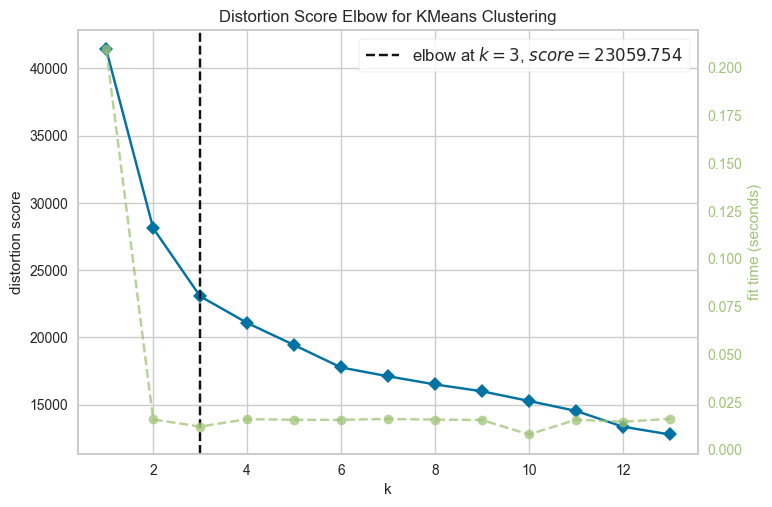

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [109]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans(random_state=0)
visualizer = KElbowVisualizer(kmeans, k=(1,14))

visualizer.fit(scaled_distr_crimes)
visualizer.show()

In [110]:
kmeans = KMeans(n_clusters=3, random_state=0, n_init=100).fit(scaled_distr_crimes)
print(kmeans.cluster_centers_)

[[ 0.09226446  0.07092313  0.14133334  0.18051322  0.06674877  0.16329954
   0.3858777   0.27604864  0.34980315  0.30135842  0.2995502   0.23835234
   0.23834879  0.26074983  0.32792119  0.01591345  0.10205252  0.14950052
   0.05170763  0.02166876  0.3849472   0.4243269   0.44695913  0.10579279
  -0.01788885  0.08642549  0.18236621  0.34246983  0.27095056  0.33237724
   0.25826602  0.33983463]
 [-0.61794762 -0.58869423 -0.67693695 -0.61881498 -0.24423276 -0.68368179
  -0.68007925 -0.57927699 -0.72530387 -0.65971637 -0.61999668 -0.63062375
  -0.76178242 -0.62703054 -0.66013093 -0.04134805 -0.50886047 -0.63320274
  -0.57934101 -0.19243036 -0.6591668  -0.85300899 -0.77096181 -0.50552551
  -0.47327094 -0.37506782 -0.49956674 -0.84065776 -0.78465741 -0.75524232
  -0.6017231  -0.73183728]
 [ 2.13086897  2.10907594  2.14670081  1.72330425  0.7010972   2.07230848
   1.02036789  1.114353    1.3758506   1.32976837  1.17359703  1.50276139
   2.04629154  1.3835194   1.20772789  0.09720157  1.63321

In [111]:
distr_codes['label'] = pd.DataFrame(kmeans.labels_)
distr_codes

,DISTR_NO,label
0,100,1
1,101,0
2,105,1
3,109,1
4,111,2
...,...,...
1289,2189,2
1290,2196,1
1291,2197,1
1292,2198,1


In [112]:
indexes_2 = distr_codes.loc[distr_codes['label'] == 2].index
indexes_1 = distr_codes.loc[distr_codes['label'] == 1].index
distr_codes.loc[indexes_2,'label'] = 1
distr_codes.loc[indexes_1,'label'] = 2

In [113]:
crime_data_district = pd.merge(distr_codes, df_pd[['DISTR_NO','LAT','LON']], on='DISTR_NO')
crime_data_district

,DISTR_NO,label,LAT,LON
0,100,2,34.0428,-118.2461
1,100,2,34.0428,-118.2461
2,100,2,34.0423,-118.2452
3,100,2,34.0460,-118.2509
4,100,2,34.0407,-118.2680
...,...,...,...,...
2114683,2198,2,34.1483,-118.6034
2114684,2198,2,34.1467,-118.6054
2114685,2198,2,34.1490,-118.6052
2114686,2198,2,34.1446,-118.5985


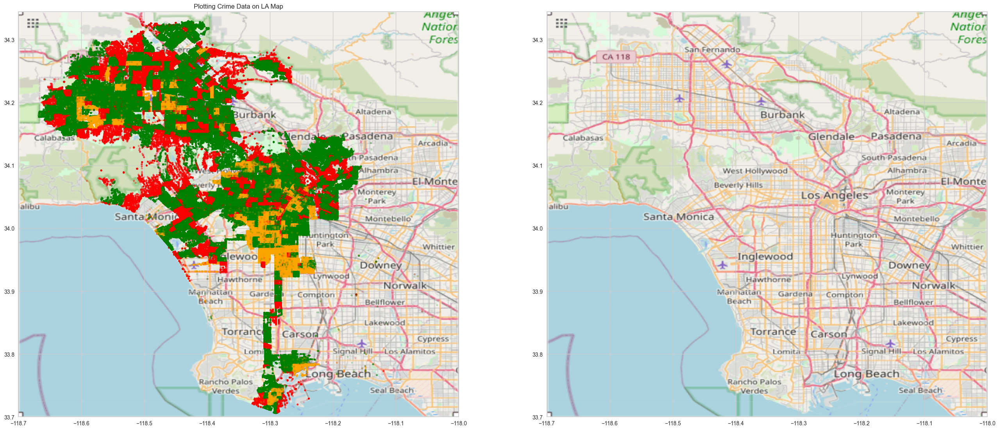

In [114]:
BBox = ((-118.7000, -118, 33.7000, 34.3450)) # coordinates of map
ruh_m = plt.imread('lamap.png') #importing the map
fig, (ax1,ax2) = plt.subplots(1,2,figsize = (32,28))
colormap = colors.ListedColormap(['green','orange' ,'red']) # create new colormap
ax1.scatter(crime_data_district.LON, crime_data_district.LAT, zorder=1, alpha= 0.2, cmap=colormap,
           c=crime_data_district.label, s=10, )
ax1.set_title('Plotting Crime Data on LA Map')
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])
ax1.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')
ax2.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')